In [73]:
# Data: time-serie data from smartwatch or smartwatch data
# %matplotlib inline # for plt.show()
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Data reading
# The smartwatch historical/time-seris data to visualize
# data_path = 'data/smartwatch_data/experimental_data_analysis/Basis_Watch_Data.csv'
# data_path = 'data/financial_data/USD_INR.csv'
data_path = 'data/bike_data/hour.csv'
data = pd.read_csv(data_path)

# Data: cleaning
# Getting rid of NaN
data = data.fillna(value=0.0)

# Showing the data file csv or comma separated value
data[:10]

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
5,6,2011-01-01,1,0,1,5,0,6,0,2,0.24,0.2576,0.75,0.0896,0,1,1
6,7,2011-01-01,1,0,1,6,0,6,0,1,0.22,0.2727,0.80,0.0000,2,0,2
7,8,2011-01-01,1,0,1,7,0,6,0,1,0.20,0.2576,0.86,0.0000,1,2,3
8,9,2011-01-01,1,0,1,8,0,6,0,1,0.24,0.2879,0.75,0.0000,1,7,8
9,10,2011-01-01,1,0,1,9,0,6,0,1,0.32,0.3485,0.76,0.0000,8,6,14


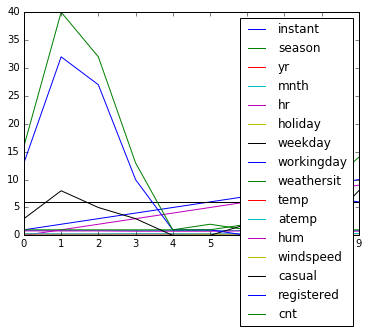

In [74]:
# # Plotting the smartwatch data before scaling/batch normalization
# data[:10000]['Price'].plot()
data[: 10].plot()
plt.legend()
plt.show()

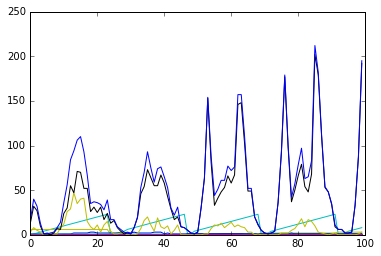

In [75]:
data_array = np.array(data)
data_array.shape, data_array.dtype
data_main = np.array(data_array[:, 2:], dtype=float)
data_main.shape, data_main.dtype

plt.plot(data_main[:100])
plt.show()

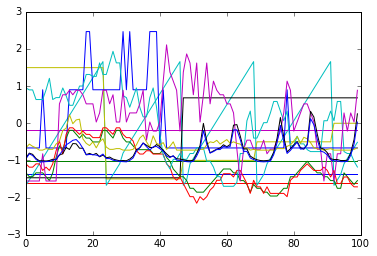

(-2.0933188371550222e-17,
 0.99999999999999978,
 0.99999999999999967,
 (17379, 15),
 dtype('float64'))

In [76]:
mean = np.mean(data_main, axis=0)
std = np.std(data_main, axis=0)
std.shape, mean.shape, std.dtype, mean.dtype

data_norm = (data_main - mean) / std
plt.plot(data_norm[:100])
plt.show()
data_norm.mean(), data_norm.std(), data_norm.var(), data_norm.shape, data_norm.dtype

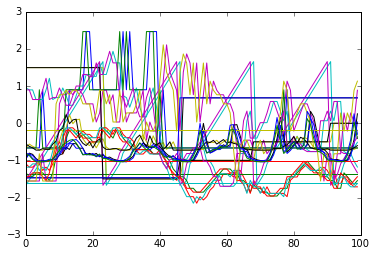

In [77]:
train_data = data_norm[:16000] # the last dim/variable/feature
test_data = data_norm[16000:] # the last dim/variable/feature
train_data.shape, test_data.shape
X_train = train_data[0:15999]
Y_train = train_data[1:16000]
X_train.shape, Y_train.shape

plt.plot(X_train[:100])
plt.plot(Y_train[:100])
plt.show()

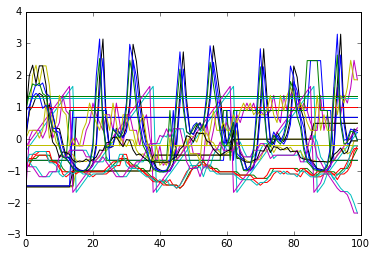

In [78]:
X_valid = test_data[0:1378] 
Y_valid = test_data[1:1379]
X_valid.shape, Y_valid.shape
plt.plot(X_valid[:100])
plt.plot(Y_valid[:100])
plt.show()

In [79]:
# Convolution impl
# from impl.im2col import *
# or
# import impl.im2col as im2col
# out_height = int(((H + (2 * pad) - kernel_height) / stride) + 1), 
# stride == 1, ALWAYS
# pad == kernel//2, ALWAYS
# kernel == min size ALWAYS, i.e. one past, one pres, one post (if exist), i.e. three or two
# kernel == 3 or 2 ALWAYS
# input=X, kernel=3or2, padding=kernel//2, stride=1, output=y
def get_im2col_indices(X_shape, field_height, field_width, padding=1, stride=1):
    # First figure out what the size of the output should be
    # Input shape
    N, C, H, W = X_shape
    
    # Kernel shape
    # field_height, field_width = kernel_shape
    field_C = C
    
    # Output shape
    assert (H + (2 * padding) - field_height) % stride == 0
    assert (W + (2 * padding) - field_width) % stride == 0
    out_height = int(((H + (2 * padding) - field_height) / stride) + 1)
    out_width = int(((W + (2 * padding) - field_width) / stride) + 1)
    out_C = 1 # the output channel/ depth

    # Row, Height, i
    i0 = np.repeat(np.arange(field_height), field_width)
    i0 = np.tile(i0, field_C)
    i1 = np.repeat(np.arange(out_height), out_width)
    i1 = np.tile(i1, out_C)
    i1 *= stride
    
    # Column, Width, j
    j0 = np.tile(np.arange(field_width), field_height * field_C)
    j1 = np.tile(np.arange(out_width), out_height * out_C)
    j1 *= stride
    
    # Channel, Depth, K
    k0 = np.repeat(np.arange(field_C), field_height * field_width) #.reshape(-1, 1) # out_C = 1
    k1 = np.repeat(np.arange(out_C), out_height * out_width) #.reshape(-1, 1) # out_C = 1
    k1 *= stride
    
    # Indices: i, j, k index
    i = i0.reshape(-1, 1) + i1.reshape(1, -1)
    j = j0.reshape(-1, 1) + j1.reshape(1, -1)
    k = k0.reshape(-1, 1) + k1.reshape(1, -1)
    
    return (k.astype(int), i.astype(int), j.astype(int))

def im2col_indices(X, field_height, field_width, padding=1, stride=1):
    """ An implementation of im2col based on some fancy indexing """
    # Zero-pad the input
    p = padding
    X_padded = np.pad(X, ((0, 0), (0, 0), (p, p), (p, p)), mode='constant') # X_NxCxHxW

    k, i, j = get_im2col_indices(X.shape, field_height, field_width, padding, stride)

    X_col = X_padded[:, k, i, j] # X_col_txkxn
    
    N, C, H, W = X.shape
    
    # field_height, field_width = kernel_shape
    field_C = C # x.shape[1]
    kernel_size = field_C * field_height * field_width
    
    X_col = X_col.transpose(1, 2, 0).reshape(kernel_size, -1)
    
    return X_col

def col2im_indices(X_col, X_shape, field_height=3, field_width=3, padding=1, stride=1):
    """ An implementation of col2im based on fancy indexing and np.add.at """
    N, C, H, W = X_shape
    H_padded, W_padded = H + (2 * padding), W + (2 * padding)
    X_padded = np.zeros((N, C, H_padded, W_padded), dtype=X_col.dtype)
    
    k, i, j = get_im2col_indices(X_shape, field_height, field_width, padding, stride)

    # field_height, field_width = kernel_shape
    field_C = C # x.shape[1]
    kernel_size = field_C * field_height * field_width

    X_col = X_col.reshape(kernel_size, -1, N).transpose(2, 0, 1) # N, K, H * W
    np.add.at(X_padded, (slice(None), k, i, j), X_col) # slice(None)== ':'
    
    return X_padded[:, :, padding:-padding, padding:-padding]

def conv_forward(X, W, b, stride=1, padding=1):
    cache = W, b, stride, padding
    
    # Input X
    n_x, d_x, h_x, w_x = X.shape
    
    # Kernel W
    n_filter, d_filter, h_filter, w_filter = W.shape
    
    # Output
    h_out = ((h_x + (2 * padding) - h_filter) / stride) + 1
    w_out = ((w_x + (2 * padding) - w_filter) / stride) + 1

    if not h_out.is_integer() or not w_out.is_integer():
        raise Exception('Invalid output dimension!')

    h_out, w_out = int(h_out), int(w_out)

    X_col = im2col_indices(X, h_filter, w_filter, padding=padding, stride=stride)
    W_col = W.reshape(n_filter, -1)

    out = (W_col @ X_col) + b
    out = out.reshape(n_filter, h_out, w_out, n_x).transpose(3, 0, 1, 2)
    cache = (X, W, b, stride, padding, X_col)

    return out, cache

def conv_backward(dout, cache):
    X, W, b, stride, padding, X_col = cache
    n_filter, d_filter, h_filter, w_filter = W.shape

    db = np.sum(dout, axis=(0, 2, 3))
    db = db.reshape(n_filter, -1)

    dout = dout.transpose(1, 2, 3, 0).reshape(n_filter, -1)
    dW = dout @ X_col.T
    dW = dW.reshape(W.shape)

    W = W.reshape(n_filter, -1)
    dX_col = W.T @ dout
    dX = col2im_indices(dX_col, X.shape, h_filter, w_filter, padding=padding, stride=stride)

    return dX, dW, db

# Pre-processing
def prepro(X_train, X_val, X_test):
    mean = np.mean(X_train)
    # scale = 255. - mean # std or sqrt(var), 255 == 2**8 or 8 bit grayscale
    # return (X_train - mean)/ scale, (X_val - mean)/ scale, (X_test - mean) / scale
    return X_train - mean, X_val - mean, X_test - mean

def selu_forward(X):
    alpha = 1.6732632423543772848170429916717
    scale = 1.0507009873554804934193349852946
    out = scale * np.where(X>=0.0, X, alpha * (np.exp(X)-1))
    cache = X
    return out, cache

def selu_backward(dout, cache):
    alpha = 1.6732632423543772848170429916717
    scale = 1.0507009873554804934193349852946
    X = cache
    dX_pos = dout.copy()
    dX_pos[X<0] = 0
    dX_neg = dout.copy()
    dX_neg[X>0] = 0
    dX = scale * np.where(X>=0.0, dX_pos, dX_neg * alpha * np.exp(X))
    return dX

# p_dropout = keep_prob in this case. 
# Is this true in other cases as well? Yes.
def selu_dropout_forward(h, q):
    '''h is activation, q is keep probability: q=1-p, p=p_dropout, and q=keep_prob'''
    alpha = 1.6732632423543772848170429916717
    scale = 1.0507009873554804934193349852946
    alpha_p = -scale * alpha
    mask = np.random.binomial(1, q, size=h.shape)
    dropped = (mask * h) + ((1 - mask) * alpha_p)
    a = 1. / np.sqrt(q + (alpha_p ** 2 * q  * (1 - q)))
    b = -a * (1 - q) * alpha_p
    out = (a * dropped) + b
    cache = (a, mask)
    return out, cache

def selu_dropout_backward(dout, cache):
    a, mask = cache
    d_dropped = dout * a
    dh = d_dropped * mask
    return dh

In [ ]:
# Model
import impl.layer as l # or from impl.layer import *
from impl.loss import * # import all functions from impl.loss file # import impl.loss as loss_func
from sklearn.utils import shuffle as skshuffle

class CNN:

    def __init__(self, D, C, H, L, p_dropout, mb_size):
        self.L = L # number of layers or depth
        self.p_dropout = p_dropout
        self.losses = {'train':[], 'smooth train':[], 'valid':[]}
        
        # Model parameters: weights and biases
        # Input layer of Conv
        self.model = []
        self.model.append(dict(
            W1=np.random.randn(H, 1, 1, 1) / np.sqrt(1 / 2.), # to make the input channels the same as H
            b1=np.zeros((H, 1)),
        ))
        
        # Hidden layers of Conv-bn-relu-dropout
        m = []
        for _ in range(self.L):
            m.append(dict(
                W2=np.random.randn(H, H, 3, 3) / np.sqrt(H*3*3 / 2.), # to go deep with convolution 
                b2=np.zeros((H, 1)),
            ))
        self.model.append(m) # self.model[0][]
        
        # Output layer of FC to output
        # output_Hx1xmb_sizexD
        self.model.append(dict(
            W3=np.random.randn(H*D*mb_size, C) / np.sqrt(H*D / 2.), # function approximation
            b3=np.zeros((1, C))
        ))
        
    def cnn_forward(self, X, train):
        
        # Preprocessing: reshaping X_txn to X_1x1xtxn 
        X = X.reshape(1, 1, *X.shape) # X_1x1xtxn
        print('X.shape', X.shape)
        
        # 1st layer - Input layer: X
        X, X_conv_cache = conv_forward(X=X, W=self.model[0]['W1'], b=self.model[0]['b1'], 
                                       padding=0, stride=1)
        X_cache = X_conv_cache
        print('X.shape', X.shape)

        # 2nd layers - Hidden layers: h
        h_cache = []
        for layer in range(self.L):
            h, h_conv_cache = conv_forward(X=X, W=self.model[1][layer]['W2'], b=self.model[1][layer]['b2'],
                                          padding=3//2, stride=1)
            h, h_nl_cache = selu_forward(X=h)
            if train:
                h, h_do_cache = selu_dropout_forward(h=h, q=self.p_dropout)
                cache = (h_conv_cache, h_nl_cache, h_do_cache)
                h_cache.append(cache)
        print('h.shape', h.shape)
  
        # 3rd layer - Output layer: y
        # Flattening layer for classification or regression
        y_cache = h.shape
        y = h.reshape(1, -1) # y_1xn
        print('y.shape', y.shape)        
        cache = (X_cache, h_cache, y_cache)
        
        return y, cache
        
    def cnn_backward(self, dy, cache):
        X_cache, h_cache, y_cache = cache

        # 3rd layer: Ouput layer y
        print('dy.shape', dy.shape)
        h_shape = y_cache
        dy = dy.reshape(h_shape)
        print('dy.shape', dy.shape)
        
        # 2nd layers: Hidden layers h
        grad2 = []
        for layer in reversed(range(self.L)):
            # if train: There is no backward in testing/prediction
            h_conv_cache, h_nl_cache, h_do_cache = h_cache[layer]
            dy = selu_dropout_backward(dout=dy, cache=h_do_cache)
            dh = selu_backward(dout=dy, cache=h_nl_cache)
            dh, dw2, db2 = conv_backward(dout=dh, cache=h_conv_cache)
            grad2.append(dict(W2=dw2, b2=db2))
            
        # 1st layer: Input layer X
        X_conv_cache = X_cache
        dX, dw1, db1 = conv_backward(dout=dh, cache=X_conv_cache)
        grad1 = dict(W1=dw1, b1=db1)

        # grad for GD
        grads = []
        grads.append(grad1)
        grads.append(grad2)
        
        return dX, grads
    
    def train_forward(self, X_mini):
        
        y, cnn_cache = self.cnn_forward(X_mini, train=True) # self.model[0] and [1]
        X = y.copy() # passed the output of previous layer to the next layer
        y, fc_cache = l.fc_forward(X=X, W=self.model[2]['W3'], b=self.model[2]['b3']) # y_1xn
        y, do_cache = l.dropout_forward(y, self.p_dropout)
       
        caches = (cnn_cache, fc_cache, do_cache)
        return y, caches
    
    def loss_function(self, y_pred, y_train): # , alpha alpha: learning rate

        # Once every epoch
        loss = l2_regression(y_pred, y_train)
        dy = dl2_regression(y_pred, y_train)
            
        return loss, dy

    def train_backward(self, dy, caches):
        cnn_cache, fc_cache, do_cache = caches
        
        # Conv 1st layer
        grads1 = {key: np.zeros_like(val) for key, val in self.model[0].items()}
        
        # Conv 2nd layer
        grads2 = []
        for _ in range(self.L):
            grads2.append({key: np.zeros_like(val) for key, val in self.model[1][0].items()})

        # 3rd layer: FC net 
        grads3 = {key: np.zeros_like(val) for key, val in self.model[2].items()}

        dy = dy.reshape(1, -1) # dy_1xn
        dy = l.dropout_backward(dy, do_cache)

        # dX, dh, grad3 = self.rnn_backward(dy, dh, rnn_caches[t])
        dX, dW3, db3 = l.fc_backward(dout=dy, cache=fc_cache)
        grads3['W3'] = dW3
        grads3['b3'] = db3

        dy = dX.copy()
        dX, grad = self.cnn_backward(dy, cnn_cache)
        for layer in range(self.L):
            for key in grad[1][layer].keys(): # 2nd layer
                grads2[layer][key] = grad[1][layer][key]

        for key in grad[0].keys(): # 1st layer
            grads1[key] = grad[0][key]
                    
        grads = []
        grads.append(grads1)
        grads.append(grads2)
        grads.append(grads3)
                
        return dX, grads

    def test(self, X_seed, size):
        ys = []
        
        for _ in range(size):
            y, _ = self.cnn_forward(X_seed, train=False) # y_1xn, X_txn
            X = y.copy() # pass it to the next layer for RNN
#             y, h, _ = self.rnn_forward(X, h, self.model[2]) # y_1xn, X_txn
            y, _ = l.fc_forward(X, self.model[2]['W3'], self.model[2]['b3']) # y_1xn, X_txn
            print('y.shape, X.shape', y.shape, X.shape)
            X = np.row_stack((X_seed, y)) # X_(t+1)xn
            print('X.shape', X.shape)
            X_seed = X[1:].copy()
            print('X.shape', X.shape)
            ys.append(y) # ys_tx1xn
            
        y_pred = np.array(ys, dtype=float).reshape(size, -1) # ys_txn
        print('y_pred.shape', y_pred.shape)
        return y_pred
        
    def get_minibatch(self, X, y, minibatch_size, shuffle):
        minibatches = []

        num_mb = X.shape[0]// minibatch_size
        for i in range(num_mb):
            X_mini = X[(i * minibatch_size): ((i + 1) * minibatch_size)]
            y_mini = y[(((i + 1) * minibatch_size) - 1): ((i + 1) * minibatch_size)] # y_1xn
            minibatches.append((X_mini, y_mini))

        return minibatches
    
    def adam(self, train_set, valid_set, alpha, mb_size, n_iter, print_after):
        X_train, y_train = train_set
        X_valid, y_valid = valid_set

        # Momentum variables
        # Input: CNN
        M, R = [], []
        M.append({key: np.zeros_like(val) for key, val in self.model[0].items()})
        R.append({key: np.zeros_like(val) for key, val in self.model[0].items()})

        # Hidden: CNN
        M_, R_ = [], []
        for layer in range(self.L):
            M_.append({key: np.zeros_like(val) for key, val in self.model[1][layer].items()})
            R_.append({key: np.zeros_like(val) for key, val in self.model[1][layer].items()})
        M.append(M_)
        R.append(R_)
        
        # RNN in this case as FC net
        # Output: FC or FFNN
        M.append({key: np.zeros_like(val) for key, val in self.model[2].items()})
        R.append({key: np.zeros_like(val) for key, val in self.model[2].items()})

        # Learning decay
        beta1 = .9
        beta2 = .99
        smooth_loss = 1.

        # Extracting the minibatches for training
        minibatches = self.get_minibatch(X_train, y_train, mb_size, shuffle=False) # seq data needs no shuffle

        # Epochs
        for iter in range(1, n_iter + 1):

            # Minibatches
            for idx in range(len(minibatches)):
                
                # Train the model
                X_mini, y_mini = minibatches[idx]
                y_pred, caches = nn.train_forward(X_mini)
                loss, dy = nn.loss_function(y_pred=y_pred, y_train=y_mini) #, alpha=alpha
                _, grads = nn.train_backward(dy, caches)
                nn.losses['train'].append(loss)
                smooth_loss = (0.999 * smooth_loss) + (0.001 * loss)
                nn.losses['smooth train'].append(smooth_loss)

                # Update the model: input layer - CNN
                for key in grads[0]:
                    M[0][key] = l.exp_running_avg(M[0][key], grads[0][key], beta1)
                    R[0][key] = l.exp_running_avg(R[0][key], grads[0][key]**2, beta2)
                    m_k_hat = M[0][key] / (1. - (beta1**iter))
                    r_k_hat = R[0][key] / (1. - (beta2**iter))
                    self.model[0][key] -= alpha * m_k_hat / (np.sqrt(r_k_hat) + l.eps)

                # Update the model: hidden layers -- CNN
                for layer in range(self.L):
                    for key in grads[1][layer]:
                        M[1][layer][key] = l.exp_running_avg(M[1][layer][key], grads[1][layer][key], beta1)
                        R[1][layer][key] = l.exp_running_avg(R[1][layer][key], grads[1][layer][key]**2, beta2)
                        m_k_hat = M[1][layer][key] / (1. - (beta1**iter))
                        r_k_hat = R[1][layer][key] / (1. - (beta2**iter))
                        self.model[1][layer][key] -= alpha * m_k_hat / (np.sqrt(r_k_hat) + l.eps)
                        
                # Update the model: output layer - RNN
                for key in grads[2]:
                    M[2][key] = l.exp_running_avg(M[2][key], grads[2][key], beta1)
                    R[2][key] = l.exp_running_avg(R[2][key], grads[2][key]**2, beta2)
                    m_k_hat = M[2][key] / (1. - (beta1**iter))
                    r_k_hat = R[2][key] / (1. - (beta2**iter))
                    self.model[2][key] -= alpha * m_k_hat / (np.sqrt(r_k_hat) + l.eps)

                # Validate the model
                y_pred = self.test(X_seed=X_valid[:mb_size], size=X_valid.shape[0])
                print('y_pred.shape, y_val.shape', y_pred.shape, y_valid.shape)
                valid_loss, _ = self.loss_function(y_pred, y_valid) # y_txn
                self.losses['valid'].append(valid_loss)

            # Print the model info: loss & accuracy or err & acc
            if iter % print_after == 0:
                print('Iter-{}, train loss: {:.4f}, valid loss: {:.4f}'.format(iter, loss, valid_loss))

In [ ]:
# Hyper-parameters
n_iter = 1 # number of epochs
alpha = 1e-4 # learning_rate
mb_size = 8 # 2**10==1024 # width, timestep for sequential data or minibatch size
num_layers = 1 # depth 
print_after = 1 # n_iter//10 # print loss for train, valid, and test
num_hidden_units = 8 # number of kernels/ filters in each layer
num_input_units = X_train.shape[1] # noise added at the input lavel as input noise we can use dX or for more improvement
num_output_units = Y_train.shape[1] # number of classes in this classification problem
p_dropout = 0.95 #  layer & unit noise: keep_prob = p_dropout, q = 1-p, 0.95 or 0.90 by default, noise at the network level or layers

# Build the model/NN and learn it: running session.
nn = CNN(D=num_input_units, H=num_hidden_units, C=num_output_units, L=num_layers, p_dropout=p_dropout, mb_size=mb_size)

nn.adam(train_set=(X_train, Y_train), valid_set=(X_valid, Y_valid), alpha=alpha, mb_size=mb_size, n_iter=n_iter, 
        print_after=print_after)

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
dy.shape (1, 7680)
dy.shape (1, 8, 64, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.s

/home/arasdar/anaconda3/envs/arasdar-DL-env/lib/python3.5/site-packages/ipykernel_launcher.py:142: RuntimeWarning: overflow encountered in exp


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

/home/arasdar/anaconda3/envs/arasdar-DL-env/lib/python3.5/site-packages/ipykernel_launcher.py:142: RuntimeWarning: invalid value encountered in greater_equal
/home/arasdar/anaconda3/envs/arasdar-DL-env/lib/python3.5/site-packages/ipykernel_launcher.py:142: RuntimeWarning: overflow encountered in multiply



X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

/home/arasdar/arasdar-DL-git/impl/loss.py:119: RuntimeWarning: overflow encountered in square
  data_loss = 0.5 * np.sum((y_pred.reshape(-1, 1) - y_train.reshape(-1, 1))**2) / m # number of dimensions


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
y_pred.shape (1378, 15)
y_pred.shape, y_val.shape (1378, 15) (1378, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
dy.shape (1, 7680)
dy.shape (1, 8, 64, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
y_pred.shape (1378, 15)
y_pred.shape, y_val.shape (1378, 15) (1378, 15)
X.shape (1, 1, 

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
y_pred.shape (1378, 15)
y_pred.shape, y_val.shape (1378, 15) (1378, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
dy.shape (1, 7680)
dy.shape (1, 8, 64, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
y_pred.shape (1378, 15)
y_pred.shape, y_val.shape (1378, 15) (1378, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
dy.shape (1, 7680)
dy.shape (1, 8, 64, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
y_pred.shape (1378, 15)
y_pred.shape, y_val.shape (1378, 15) (1378, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
dy.shape (1, 7680)
dy.shape (1, 8, 64, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64,

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h

X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64,

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65,

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)


h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65

h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15) (1, 7680)
X.shape (65, 15)
X.shape (65, 15)
X.shape (1, 1, 64, 15)
X.shape (1, 8, 64, 15)
h.shape (1, 8, 64, 15)
y.shape (1, 7680)
y.shape, X.shape (1, 15

In [ ]:
# # Display the learning curve and losses for training, validation, and testing
# %matplotlib inline
# %config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt

plt.plot(nn.losses['train'], label='Train loss')
plt.plot(nn.losses['smooth train'], label='Train smooth loss')
plt.legend()
plt.show()

In [ ]:
plt.plot(nn.losses['valid'], label='Valid loss')
plt.legend()
plt.show()

In [ ]:
y_pred = nn.test(X_valid[:conv_size], size=X_valid.shape[0], h=nn.initial_state())

plt.plot(y_pred[:200, -1], label='y_pred')
plt.plot(Y_valid[:200, -1], label='Y_valid')
plt.legend()
plt.show()